In [5]:
from predator_prey import PredatorPreyModel
import matplotlib.pyplot as plt

# RUN THE EXPERIMENT

generations = 20
max_steps_per_generation = 2000
model = PredatorPreyModel(        
            predator_population_size=10,
            prey_population_size=40,
            steps_per_generation=max_steps_per_generation,

            predator_catch_reward=10,
            prey_death_reward=-10,
            predator_movement_reward=-0.1,
            prey_movement_reward=-0.03,
            prey_alive_reward=2,

            prey_max_speed=30,
            prey_acceleration_factor=5,
            prey_message_number=1,

            predator_max_speed=20,
            predator_acceleration_factor=5,
            predator_message_number=1,

            conspecific_vision_cap=4,
            heterospecific_vision_cap=4,
            catch_range=1,

            mutation_rate=0.1,
            mutation_strength=0.2,
            mutation_flip_rate=0.01,
            agent_initial_weights_disp = 0.3,

            width=50,
            height=50,
            dt=0.05,
)   


while model.generation_counter < generations:
    model.step()

    # Retrieve and plot data
agent_data = model.datacollector.get_agent_vars_dataframe()
model_data = model.datacollector.get_model_vars_dataframe()


0
Ended generation early, all prey dead
1
Ended generation early, all prey dead
2
Ended generation early, all prey dead
3
Ended generation early, all prey dead
4
Ended generation early, all prey dead
5
6
Ended generation early, all prey dead
7
Ended generation early, all prey dead
8
Ended generation early, all prey dead
9
Ended generation early, all prey dead
10
11
Ended generation early, all prey dead
12
Ended generation early, all prey dead
13
Ended generation early, all prey dead
14
Ended generation early, all prey dead
15
16
Ended generation early, all prey dead
17
Ended generation early, all prey dead
18
Ended generation early, all prey dead
19


In [6]:
import ast
import plotly.express as px

agent_data = model.datacollector.get_agent_vars_dataframe()
model_data = model.datacollector.get_model_vars_dataframe()
# VISUALIZE RESULTS

species_colors = {'predator': 'tomato',
                  'prey':'lightskyblue' }
for generation in agent_data['Generation'].unique()[-5:]:  # Last 5 generations
# Reset index to flatten the DataFrame
    generation_data = agent_data[agent_data['Generation'] == generation]
    agent_data_reset = generation_data.reset_index()

    # Parse position data and create 'X' and 'Y' columns
    def parse_pos(pos):
        if isinstance(pos, str):
            pos = ast.literal_eval(pos)
        return pos

    agent_data_reset.loc[:, 'Pos'] = agent_data_reset['Pos'].apply(parse_pos)
    agent_data_reset.loc[:, 'X'] = agent_data_reset['Pos'].apply(lambda pos: pos[0])
    agent_data_reset.loc[:, 'Y'] = agent_data_reset['Pos'].apply(lambda pos: pos[1])

    # Filter out dead agents if necessary
    agent_data_alive = agent_data_reset[agent_data_reset['Alive'] == True].copy()
    agent_data_alive.loc[:,'agentID_str'] = agent_data_alive['AgentID'].apply(lambda x: str(x))
    # Create the interactive scatter plot
    fig = px.scatter(
        agent_data_alive,
        x='X',
        y='Y',
        animation_frame='Step',
        animation_group='agentID_str',
        color='Species',
        color_discrete_map=species_colors,
        hover_name='agentID_str',
        hover_data={'Fitness': True,
                    'Heading': True,
                    'Message': True,},
        range_x=[agent_data_reset['X'].min() - 1, agent_data_reset['X'].max() + 1],
        range_y=[agent_data_reset['Y'].min() - 1, agent_data_reset['Y'].max() + 1],
        labels={'X': 'X Position', 'Y': 'Y Position'},
        title=f'Generation {generation}'
    )

    # Customize the layout
    fig.update_layout(
        width=800,
        height=600,
        xaxis=dict(scaleanchor="y", scaleratio=1),
        yaxis=dict(scaleanchor="x", scaleratio=1),
        legend_title_text='Species'
    )

    fig.show()
    #fig.write_html(f"Generation {generation}.html")

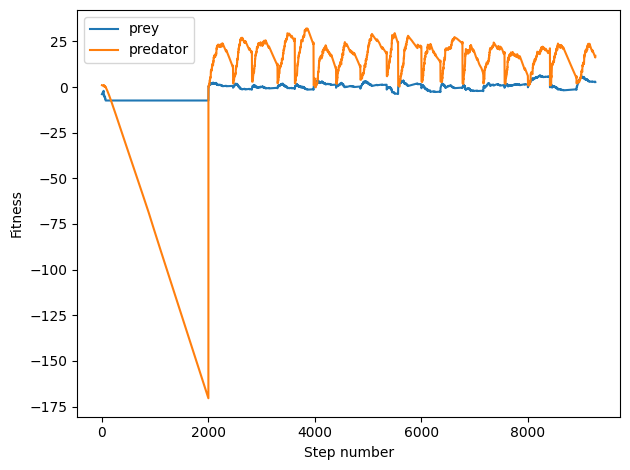

In [11]:
# Plot average fittn
plt.plot(model_data.index, model_data.Avg_prey_fitness, label='prey')
plt.plot(model_data.index, model_data.Avg_predator_fitness, label='predator')
plt.legend()
plt.xlabel('Step number')
plt.ylabel('Fitness')
plt.tight_layout()